In [1]:
#!pip install --user pillow

In [2]:
from IPython import display
imgurl="../../images/Sanssouci.jpg"
display.Image(url=imgurl)

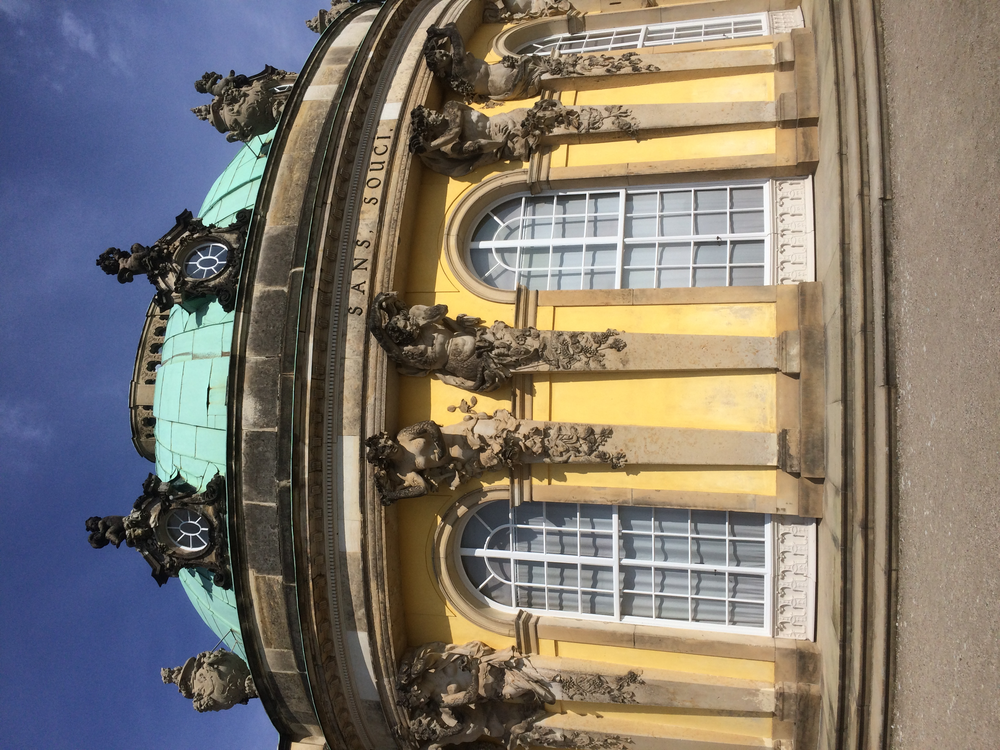

In [3]:
infile="../../images/Sanssouci.jpg"
with open(infile, "rb") as fp:
    rawdata = fp.read()
display.Image(data=rawdata)

In [4]:
from PIL import Image
import io
im = Image.open(io.BytesIO(rawdata))

In [5]:
print(infile, im.format, "%dx%d" % im.size, im.mode)

../../images/Sanssouci.jpg JPEG 3264x2448 RGB


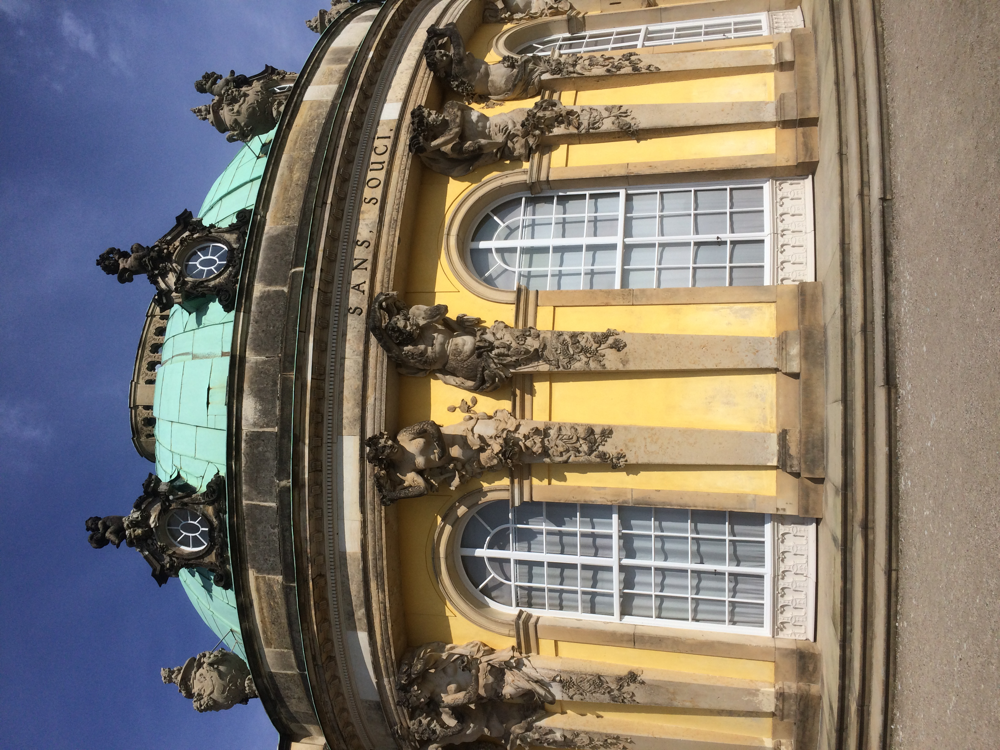

In [6]:
im

In [7]:
thumb_size = (512,512)
im.thumbnail(thumb_size)

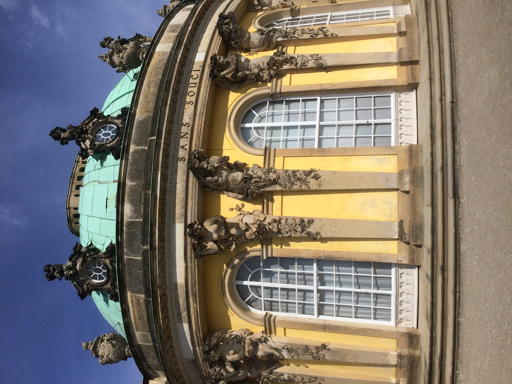

In [8]:
im

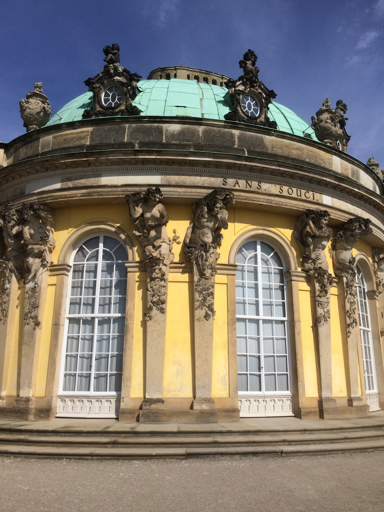

In [9]:
rot_im = im.rotate(270, expand=1)
rot_im

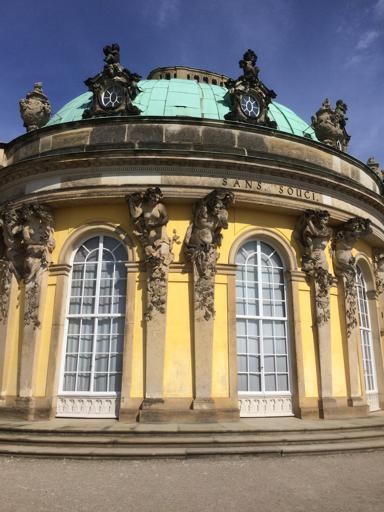

In [10]:
buf = io.BytesIO()
rot_im.save(buf,"JPEG")
display.Image(data=buf.getvalue())

In [65]:
from PIL import Image
from PIL.ExifTags import TAGS, GPSTAGS
from fractions import Fraction

class ImageMetaData(object):
    '''
    Extract the exif data from any image. Data includes GPS coordinates, 
    Focal Length, Manufacture, and more.
    '''
    exif_data = None
    image = None

    def __init__(self, image):
        self.image = image
        #print(self.image._getexif())
        self.get_exif_data()
        super(ImageMetaData, self).__init__()

    def get_exif_data(self):
        """Returns a dictionary from the exif data of an PIL Image item. Also converts the GPS Tags"""
        exif_data = {}
        info = self.image._getexif()
        if info:
            for tag, value in info.items():
                decoded = TAGS.get(tag, tag)
                if decoded == "GPSInfo":
                    gps_data = {}
                    for t in value:
                        sub_decoded = GPSTAGS.get(t, t)
                        gps_data[sub_decoded] = value[t]

                    exif_data[decoded] = gps_data
                else:
                    exif_data[decoded] = value
        self.exif_data = exif_data
        return exif_data

    def get_if_exist(self, data, key):
        if key in data:
            return data[key]
        return None

    def convert_to_degress(self, value):
        """Helper function to convert the GPS coordinates 
        stored in the EXIF to degress in float format"""
        d,m,s = map(lambda x: float(Fraction(x[0],x[1])), value)
        return d + (m / 60.0) + (s / 3600.0)

    def get_lat_lng(self):
        """Returns the latitude and longitude, if available, from the provided exif_data (obtained through get_exif_data above)"""
        lat = None
        lon = None
        exif_data = self.get_exif_data()
        if "GPSInfo" in exif_data:      
            gps_info = exif_data["GPSInfo"]
            gps_latitude = self.get_if_exist(gps_info, 'GPSLatitude')
            gps_latitude_ref = self.get_if_exist(gps_info, 'GPSLatitudeRef')
            gps_longitude = self.get_if_exist(gps_info, 'GPSLongitude')
            gps_longitude_ref = self.get_if_exist(gps_info, 'GPSLongitudeRef')

            if gps_latitude and gps_latitude_ref and gps_longitude and gps_longitude_ref:
                lat = self.convert_to_degress(gps_latitude)
                if gps_latitude_ref != 'N':
                    lat = 0 - lat

                lon = self.convert_to_degress(gps_longitude)
                if gps_longitude_ref != 'E':
                    lon = 0 - lon
                
        return lat, lon
    

In [66]:
meta_data = ImageMetaData(im)

In [67]:
exif_data = meta_data.get_exif_data()
print(exif_data)

{'GPSInfo': {'GPSLatitudeRef': 'N', 'GPSLatitude': ((52, 1), (24, 1), (46, 100)), 'GPSLongitudeRef': 'E', 'GPSLongitude': ((13, 1), (2, 1), (2798, 100)), 'GPSAltitudeRef': b'\x00', 'GPSAltitude': (18785, 523), 'GPSTimeStamp': ((10, 1), (27, 1), (4545, 100)), 'GPSSpeedRef': 'K', 'GPSSpeed': (0, 1), 'GPSImgDirectionRef': 'M', 'GPSImgDirection': (13938, 2225), 'GPSDestBearingRef': 'M', 'GPSDestBearing': (13938, 2225), 'GPSDateStamp': '2018:03:30', 'GPSHPositioningError': (2000, 1)}, 'ResolutionUnit': 2, 'ExifOffset': 206, 'Make': 'Apple', 'Model': 'iPhone 5s', 'Software': '11.2.6', 'Orientation': 6, 'DateTime': '2018:03:30 12:27:48', 'YCbCrPositioning': 1, 'XResolution': (72, 1), 'YResolution': (72, 1), 'ExifVersion': b'0221', 'ComponentsConfiguration': b'\x01\x02\x03\x00', 'ShutterSpeedValue': (7678, 623), 'DateTimeOriginal': '2018:03:30 12:27:48', 'DateTimeDigitized': '2018:03:30 12:27:48', 'ApertureValue': (7983, 3509), 'BrightnessValue': (22969, 1998), 'ExposureBiasValue': (0, 1), 'Me

In [68]:
display.JSON(exif_data)

<IPython.core.display.JSON object>

In [69]:
latlng = meta_data.get_lat_lng()
print(latlng)

(52.400127777777776, 13.041105555555555)


In [70]:
#!pip install --user ipyleaflet

In [71]:
#!conda install -c conda-forge ipyleaflet
#!jupyter labextension install jupyter-leaflet
#!conda install -c conda-forge ipywidgets
#!jupyter labextension install @jupyter-widgets/jupyterlab-manager

In [78]:
from ipyleaflet import (
    Map,
    Marker, MarkerCluster,
    TileLayer, ImageOverlay,
    Polyline, Polygon, Rectangle, Circle, CircleMarker,
    GeoJSON,
    DrawControl,
    basemaps
)

In [79]:
# show map
center = latlng
zoom = 100
m = Map(center=center, zoom=zoom)
mark = Marker(location=m.center)
m += mark
mark.interact(opacity=(0.0,1.0,0.01))
display.display(m)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map data (c) <a href="https://openstreetmap.org">OpenStreetMap</a> contributors'}, center=[52.400127777777776, 13.041105555555555], layers=(TileLayer(base=True, max_zoom=19, min_zoom=1, options=['attribution', 'detect_retina', 'max_zoom', 'min_zoom', 'tile_size']), Marker(location=[52.400127777777776, 13.041105555555555], options=['alt', 'clickable', 'draggable', 'keyboard', 'rise_offset', 'rise_on_hover', 'title', 'z_index_offset'])), options=['attribution_control', 'basemap', 'bounce_at_zoom_limits', 'box_zoom', 'center', 'close_popup_on_click', 'double_click_zoom', 'dragging', 'inertia', 'inertia_deceleration', 'inertia_max_speed', 'keyboard', 'keyboard_pan_offset', 'keyboard_zoom_offset', 'max_zoom', 'min_zoom', 'scroll_wheel_zoom', 'tap', 'tap_tolerance', 'touch_zoom', 'world_copy_jump', 'zoom', 'zoom_animation_threshold', 'zoom_control', 'zoom_start'], zoom=100)

In [80]:
import requests
# call image analyze service
vision_base_url = "https://westcentralus.api.cognitive.microsoft.com/vision/v1.0/"
vision_analyze_url = vision_base_url + "analyze"

headers    = {'Ocp-Apim-Subscription-Key': "62508f63da9a4d60a0950b2705b7224c", 
              "Content-Type": "application/octet-stream" }
params     = {'visualFeatures': 'Categories,Tags,Description,Color',
              'language':'en'}
response   = requests.post(vision_analyze_url, 
                           headers=headers, 
                           params=params, 
                           data=buf.getvalue())
response.raise_for_status()
analysis      = response.json()

A statue in front of sanssouci


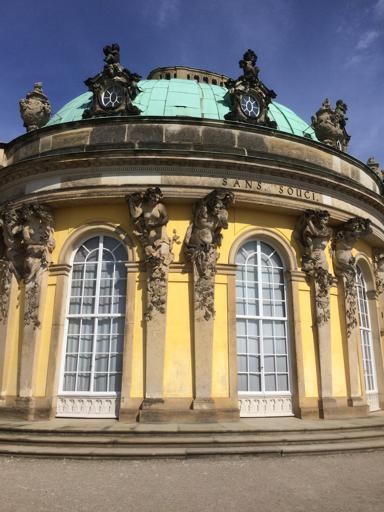

In [81]:
image_caption = analysis["description"]["captions"][0]["text"].capitalize()
print(image_caption)
display.Image(data=buf.getvalue())

In [82]:
 display.JSON(data=analysis)

<IPython.core.display.JSON object>